In [897]:
"""
Configuration BLock
-------------------
Place any constants and variables here
"""

DATA_PATH = "/kaggle/input/airquality/AirQualityUCI.xlsx"
NO_DATA = -200
TO_PREDICT = ['CO(GT)','C6H6(GT)','NOx(GT)','NO2(GT)']

# Importing Necessary Libraries

In [898]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from scipy.stats import skew, uniform
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import BaggingRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
import plotly.subplots as sp
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline


# Loading Data

In [899]:

df = pd.read_excel(DATA_PATH,  parse_dates={'datetime': ['Date', 'Time']})


In [900]:
# Describe each column in the dataset, in terms of statistics
df.describe()

,datetime,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
mean,2004-09-21 16:00:00,-34.207524,1048.869652,-159.090093,1.865576,894.475963,168.604200,794.872333,58.135898,1391.363266,974.951534,9.776600,39.483611,-6.837604
min,2004-03-10 18:00:00,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000
25%,2004-06-16 05:00:00,0.600000,921.000000,-200.000000,4.004958,711.000000,50.000000,637.000000,53.000000,1184.750000,699.750000,10.950000,34.050000,0.692275
50%,2004-09-21 16:00:00,1.500000,1052.500000,-200.000000,7.886653,894.500000,141.000000,794.250000,96.000000,1445.500000,942.000000,17.200000,48.550000,0.976823
75%,2004-12-28 03:00:00,2.600000,1221.250000,-200.000000,13.636091,1104.750000,284.200000,960.250000,133.000000,1662.000000,1255.250000,24.075000,61.875000,1.296223
max,2005-04-04 14:00:00,11.900000,2039.750000,1189.000000,63.741476,2214.000000,1479.000000,2682.750000,339.700000,2775.000000,2522.750000,44.600000,88.725000,2.231036
std,NaN,77.657170,329.817015,139.789093,41.380154,342.315902,257.424561,321.977031,126.931428,467.192382,456.922728,43.203438,51.215645,38.976670


In [901]:
df.head()

,datetime,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10 18:00:00,2.6,1360.00,150,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,13.60,48.875001,0.757754
1,2004-03-10 19:00:00,2.0,1292.25,112,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,13.30,47.700000,0.725487
2,2004-03-10 20:00:00,2.2,1402.00,88,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,11.90,53.975000,0.750239
3,2004-03-10 21:00:00,2.2,1375.50,80,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,11.00,60.000000,0.786713
4,2004-03-10 22:00:00,1.6,1272.25,51,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,11.15,59.575001,0.788794


In [902]:
print("Output from df.info")
df.info()

Output from df.info
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   datetime       9357 non-null   datetime64[ns]
 1   CO(GT)         9357 non-null   float64       
 2   PT08.S1(CO)    9357 non-null   float64       
 3   NMHC(GT)       9357 non-null   int64         
 4   C6H6(GT)       9357 non-null   float64       
 5   PT08.S2(NMHC)  9357 non-null   float64       
 6   NOx(GT)        9357 non-null   float64       
 7   PT08.S3(NOx)   9357 non-null   float64       
 8   NO2(GT)        9357 non-null   float64       
 9   PT08.S4(NO2)   9357 non-null   float64       
 10  PT08.S5(O3)    9357 non-null   float64       
 11  T              9357 non-null   float64       
 12  RH             9357 non-null   float64       
 13  AH             9357 non-null   float64       
dtypes: datetime64[ns](1), float64(12), int64(1)
memory u

In [903]:
dShape = df.shape
print("Rows : " + str(dShape[0]))
print("Columns : " + str(dShape[1]))

Rows : 9357
Columns : 14


In [904]:
cols = df.columns
print(cols)

Index(['datetime', 'CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)',
       'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH'],
      dtype='object')


We need to now check for missing values in the dataset. The dataset has -200 in the places where there are missing values.

In [905]:
"""
Lets analyze the number of missing values

In this dataset, empty values are represented with -200 

"""

emptyByCols = {}
def resetECB():
  global emptyByCols
  for col in cols:
    emptyByCols[col] = 0

resetECB()

def findMissingCels(row):
  global emptyByCols
  for col in cols:
    if col != "datetime" and row[col] == NO_DATA:
        emptyByCols[col] += 1 
        row[col] = np.nan
        

df.apply(findMissingCels, axis=1)

for key,value in emptyByCols.items():
  print(key + " : " + str(value))

datetime : 0
CO(GT) : 1683
PT08.S1(CO) : 366
NMHC(GT) : 8443
C6H6(GT) : 366
PT08.S2(NMHC) : 366
NOx(GT) : 1639
PT08.S3(NOx) : 366
NO2(GT) : 1642
PT08.S4(NO2) : 366
PT08.S5(O3) : 366
T : 366
RH : 366
AH : 366


We see that there are 90% missing cells in NMHC(GT).
Therefore we need to drop this, since considering the missing data of various months, **imputing** is not recommended by techniques such as moving averages, etc.

Create new features to represent year, month, day, hour for the datetime feilds as inputs

In [906]:
"""
We can see that there are 8443 cells empty out of 9357 cells for NMHC(GT)
"""
df.drop('NMHC(GT)', axis=1, inplace=True)
df['year'] = df['datetime'].dt.year
df['month'] = df['datetime'].dt.month
df['day'] = df['datetime'].dt.day
df['hour'] = df['datetime'].dt.hour
df.drop(["datetime"], axis=1, inplace=True)

In [907]:
#Updates columns
cols = df.columns
print(cols)

Index(['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH',
       'AH', 'year', 'month', 'day', 'hour'],
      dtype='object')


Drop the rows which have at least one missing value

In [908]:
def changeToNA(row):
  for col in cols:
    if row[col] == NO_DATA:
      row[col] = np.nan
  return row

df = df.apply(changeToNA, axis = 1)

df = df.dropna(axis=0)

df.describe()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,year,month,day,hour
count,6941.000000,6941.000000,6941.000000,6941.000000,6941.000000,6941.000000,6941.000000,6941.000000,6941.000000,6941.000000,6941.000000,6941.000000,6941.000000,6941.00000,6941.000000,6941.000000
mean,2.182467,1119.786222,10.554411,958.421925,250.656476,816.771659,113.858608,1452.528598,1057.631753,17.753280,48.880121,0.985573,2004.280939,6.02723,15.996686,12.020170
std,1.441158,218.739106,7.465170,264.052415,208.603978,251.896825,47.464705,353.297883,406.505668,8.845398,17.432652,0.401097,0.449490,3.48971,8.708181,6.813924
min,0.100000,647.250000,0.181525,390.250000,2.000000,322.000000,2.000000,551.000000,221.000000,-1.900000,9.175000,0.184679,2004.000000,1.00000,1.000000,0.000000
25%,1.100000,956.250000,4.927071,759.750000,103.000000,642.250000,79.000000,1206.500000,759.500000,11.200000,35.325001,0.694123,2004.000000,3.00000,9.000000,7.000000
50%,1.900000,1084.750000,8.788282,931.000000,186.000000,785.500000,110.000000,1457.000000,1006.250000,16.850000,49.175000,0.953910,2004.000000,6.00000,16.000000,12.000000
75%,2.900000,1254.000000,14.579057,1135.250000,334.600000,946.500000,142.000000,1683.000000,1322.000000,23.724999,62.224999,1.251552,2005.000000,9.00000,24.000000,18.000000
max,11.900000,2039.750000,63.741476,2214.000000,1479.000000,2682.750000,332.600000,2775.000000,2522.750000,44.600000,88.725000,2.180639,2005.000000,12.00000,31.000000,23.000000


In [909]:
df.shape

(6941, 16)

Find the percentage of unique values in each feature

In [910]:
# Find number of uniques in each column
uniDF = {
    "Column" : [],
    "%Uniques" : []
}
for col in cols[1:]:
    uniDF["Column"].append(col)
    uniDF["%Uniques"].append((df[col].nunique() / (df.shape[0])) * 100.0)
    
uniDF = pd.DataFrame(uniDF)

uniDF
    

,Column,%Uniques
0,PT08.S1(CO),43.048552
1,C6H6(GT),49.258032
2,PT08.S2(NMHC),49.258032
3,NOx(GT),33.266100
4,PT08.S3(NOx),45.036738
5,NO2(GT),19.118283
6,PT08.S4(NO2),56.504826
7,PT08.S5(O3),59.443884
8,T,43.307881
9,RH,61.244777


In [911]:
# Validate that all missing value rows have been iradicated
resetECB()
df.apply(findMissingCels, axis=1)
print(emptyByCols)

{'datetime': 0, 'CO(GT)': 0, 'PT08.S1(CO)': 0, 'NMHC(GT)': 8443, 'C6H6(GT)': 0, 'PT08.S2(NMHC)': 0, 'NOx(GT)': 0, 'PT08.S3(NOx)': 0, 'NO2(GT)': 0, 'PT08.S4(NO2)': 0, 'PT08.S5(O3)': 0, 'T': 0, 'RH': 0, 'AH': 0, 'year': 0, 'month': 0, 'day': 0, 'hour': 0}


In [912]:
dShape = df.shape
print("Rows : " + str(dShape[0]))
print("Columns : " + str(dShape[1]))

Rows : 6941
Columns : 16


In [913]:
# more data exploration through visualizing
#plotting histograms of each category to idenitfy patterns in the data


df_skewness = df.apply(skew)

print(df_skewness)

CO(GT)           1.338861
PT08.S1(CO)      0.701396
C6H6(GT)         1.301414
PT08.S2(NMHC)    0.509721
NOx(GT)          1.643276
PT08.S3(NOx)     1.178926
NO2(GT)          0.583956
PT08.S4(NO2)     0.201727
PT08.S5(O3)      0.552003
T                0.398296
RH              -0.010521
AH               0.357700
year             0.974777
month            0.277256
day             -0.055648
hour            -0.118182
dtype: float64


We can see that RH, though negative, is very close to 0, therefore seems to be very close to being a unifiorm distribution
All other columns are positively skewed, so NO negatvely skewed distrbutions of any column

In [914]:
uni_dist = ['RH','day']
pos_skew = [col for col in cols if col not in uni_dist and col != "datetime"]

In [915]:
def plotHistogram(colName, position, msg, dataset, color = "red"):
    sns.histplot(data=dataset, x=colName,  color=color, ax=position)
    position.set_title(msg, pad=10)


# Uniform Distribution

# Poitively Skewed Distributions

In [916]:
scaler = StandardScaler()
cols = df.columns
norm_df = scaler.fit_transform(df)
norm_df = pd.DataFrame(norm_df, columns = cols)

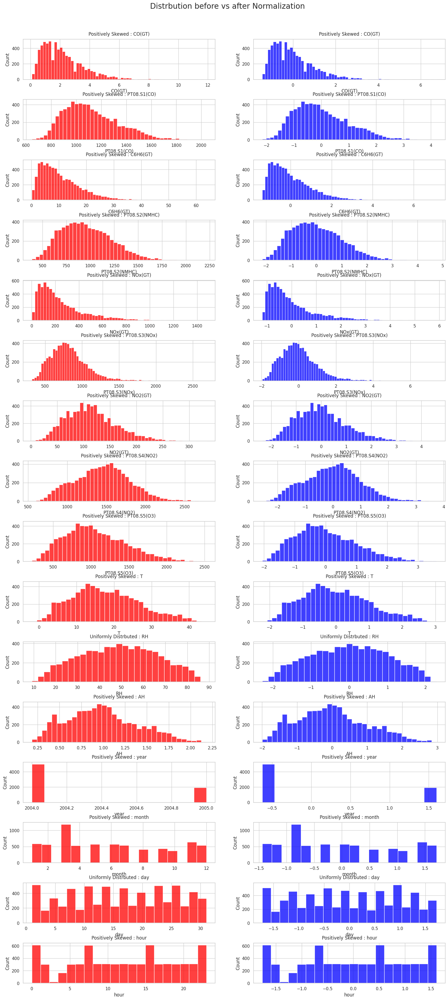

In [917]:
def plotHistComp(cols, title, df1, df2):
    fig, axes = plt.subplots(len(cols),2, figsize=(20, 45))
    plt.subplots_adjust(hspace=0.5)
    fig.suptitle(title, fontsize=20, y=0.91)
    for row in range(len(cols)):
        if cols[row] in pos_skew:
            dist_str = "Positively Skewed"
        else:
            dist_str = "Uniformly Distrbuted"
        plotHistogram(cols[row], axes[row][0], "{} : {}".format(dist_str,cols[row]),df1)
        plotHistogram(cols[row], axes[row][1], "{} : {}".format(dist_str,cols[row]),df2, color="blue")


plotHistComp(df.columns,"Distrbution before vs after Normalization", df, norm_df)

In [918]:
from sklearn.model_selection import train_test_split

def getDataset(data, indep_val, dep_val, tsize = 0.3):
    X=data[indep_val]
    y=data[dep_val]
    # X_train, X_test, y_train, y_test
    return train_test_split(X, y, test_size=tsize)


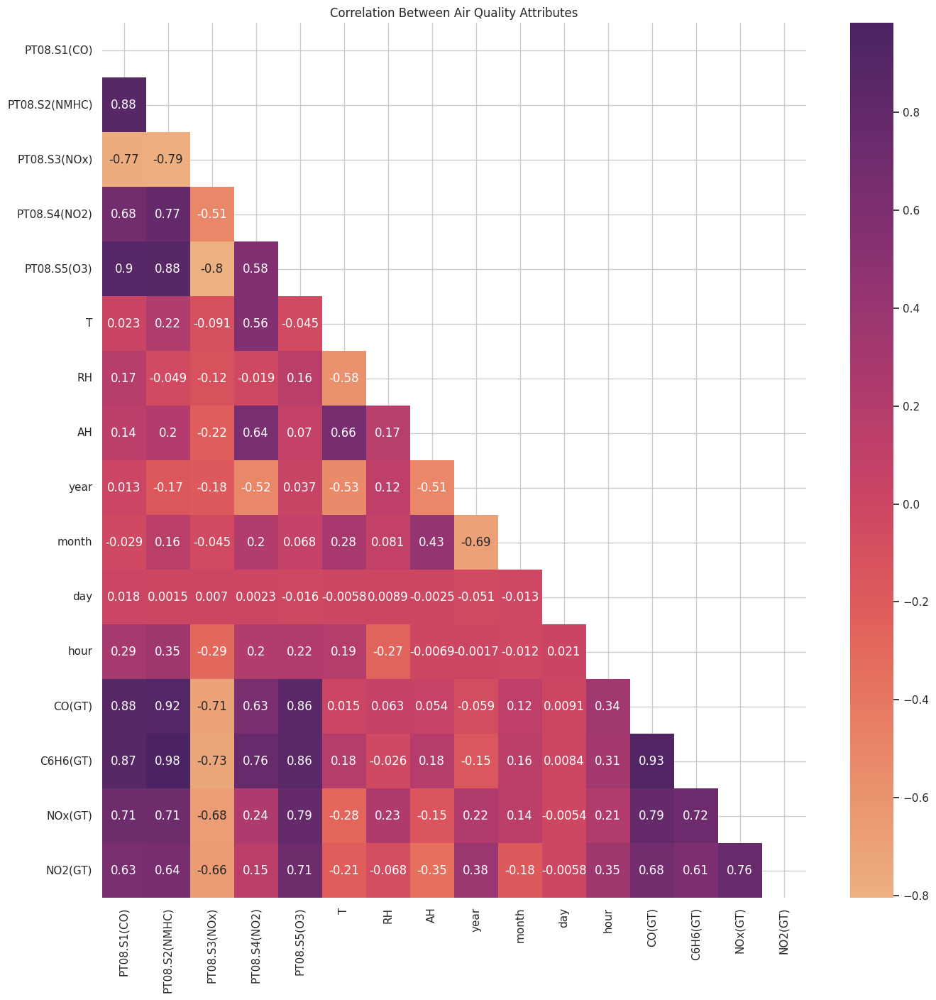

In [919]:
def displayHeatMap(dim1, dim2, title, df):
    fig=plt.figure(figsize=(dim1,dim2))
    plt.title(title)
    sns.heatmap(df, annot= True, cmap='flare')

corr = train_df.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

# Apply the mask to the correlation matrix
lower_triangle_corr_matrix = corr.mask(mask)
displayHeatMap(df.shape[1],df.shape[1] , 'Correlation Between Air Quality Attributes', lower_triangle_corr_matrix)

In [920]:
def plotScatterSingle(df, x, y, fill, title, trendline = 'ols'):
    fig = px.scatter(df, 
    x=x, 
    y=y, 
    color=fill, 
    trendline=trendline,
    title=title)
    
    fig.show()

In [921]:
plotScatterSingle(df, "PT08.S2(NMHC)", "PT08.S1(CO)", "C6H6(GT)" ,"Strong Positive Linear Relationship of C6H6(GT) with PT08.S2(NMHC), PT08.S1(CO)")

In [922]:
plotScatterSingle(filter_df, "PT08.S3(NOx)", "CO(GT)", "CO(GT)" ,"Non Linear Relation ship between CO(GT) and PT08.S3(NOx)")

In [923]:
plotScatterSingle(filter_df, "PT08.S5(O3)", "PT08.S3(NOx)", "CO(GT)" ,"Strong Negative Linear Relationship of CO(GT) with PT08.S2(NMHC), PT08.S5(O3)")

In [924]:
tmp_df = df.copy()
tmp_df['datetime'] = pd.to_datetime(df[['year', 'month', 'day', 'hour']])
plotScatterSingle(tmp_df, "CO(GT)", "datetime", "CO(GT)" ,"Change in CO levels over the two years", trendline=None)

In [925]:
plotScatterSingle(df, "PT08.S5(O3)", "T", "PT08.S5(O3)" ,"Concentration of ozone with temperature")

In [926]:

def plotAllPredictors():
    features = [c for c in filter_df.columns if c not in TO_PREDICT and c not in ["year","month","day","hour"]]
    num_features = len(features)
    
    num_plots = (num_features * (num_features - 1)) // 2
    
    fig = sp.make_subplots(rows=num_features-1, cols=num_features-1, 
                           shared_xaxes=True, shared_yaxes=True,
                           horizontal_spacing=0.02, vertical_spacing=0.02)

    # Generate scatter plots for upper triangle
    for i in range(num_features - 1):
        for j in range(i + 1, num_features):
            row = i + 1
            col = j - i
            scatter_fig = px.scatter(filter_df, x=features[i], y=features[j])
            fig.add_trace(scatter_fig.data[0], row=row, col=col)

            if row == 1:
                fig.update_xaxes(title_text=features[j], row=row, col=col)
            if col == 1:
                fig.update_yaxes(title_text=features[i], row=row, col=col)

    
    fig.update_layout(height=2000, width=2000)

    fig.show()
    
plotAllPredictors()

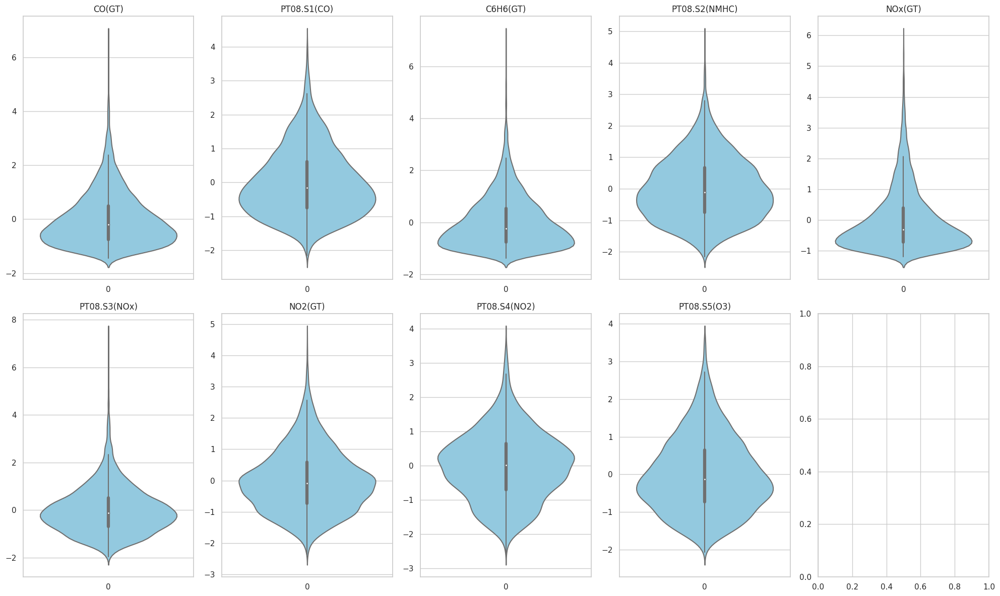

In [927]:
air_quality_cols = ['CO(GT)', 'PT08.S1(CO)','C6H6(GT)', 
                    'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 
                    'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']

def plotViolinPlots(data):
    # Plot violin plots for each air quality variable
    fig, axes = plt.subplots(2,5,figsize=(20,12))
    sns.set(style="whitegrid")
    for i, col in enumerate(air_quality_cols, start=0):
        sns.violinplot(data=data[col], color='skyblue', inner="box", showfliers=True, ax=axes[int(i/5)][i%5])
        axes[int(i/5)][i%5].set_title(col)

    plt.tight_layout()
    plt.show()
    
plotViolinPlots(norm_df)

In [928]:
def findWhiskers(col):
    q1 = norm_df[col].quantile(0.25)
    q3 = norm_df[col].quantile(0.75)
    iqr = q3 - q1
    lower_whisker = q1 - 1.5 * iqr
    upper_whisker = q3 + 1.5 * iqr
    return [lower_whisker,upper_whisker]

filter_df = norm_df.copy()
for col in ["PT08.S3(NOx)","CO(GT)","C6H6(GT)","NOx(GT)","PT08.S3(NOx)"]:
    whiskers = findWhiskers(col)
    filter_df= filter_df[(filter_df[col] >= whiskers[0]) & (filter_df[col] <= whiskers[1])]


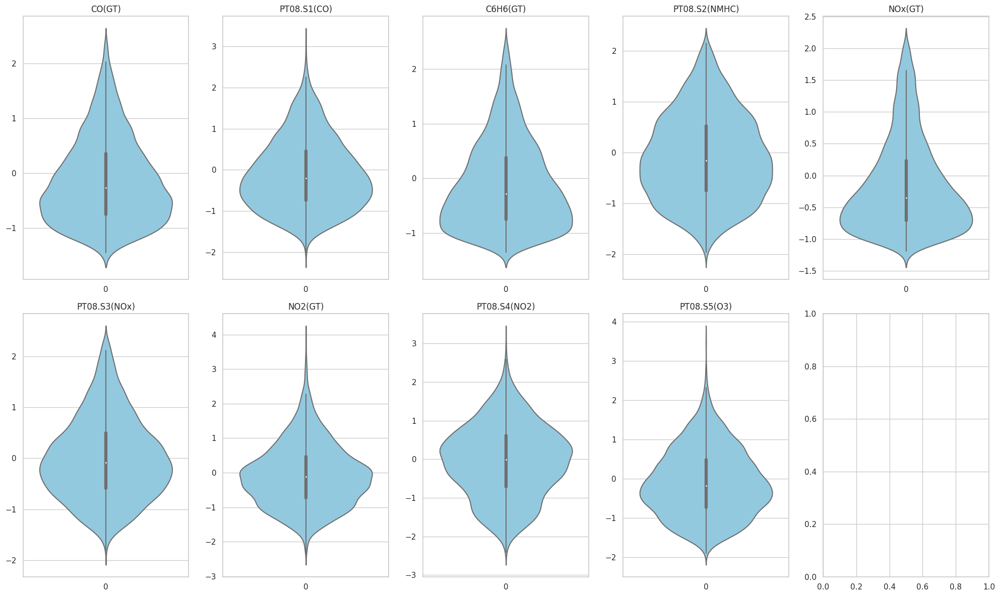

In [929]:
plotViolinPlots(filter_df)

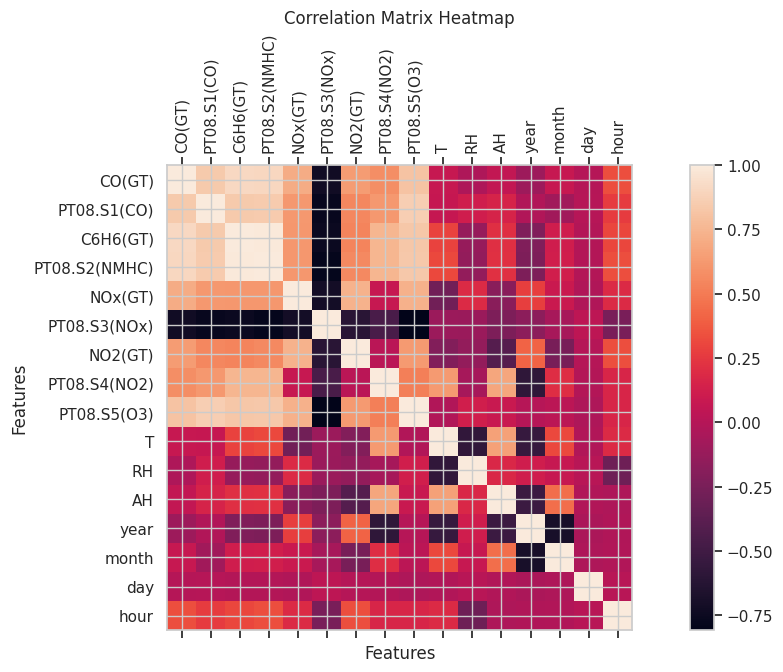

In [930]:
plt.matshow(filter_df.corr())
plt.colorbar()
columns = filter_df.columns
plt.xticks(ticks=np.arange(len(columns)), labels=columns, rotation=90)
plt.yticks(ticks=np.arange(len(columns)), labels=columns)
plt.xlabel('Features')
plt.ylabel('Features')

plt.title('Correlation Matrix Heatmap')
plt.gcf().set_size_inches(15, 6)  

plt.show()

<Axes: xlabel='CO(GT)', ylabel='Count'>

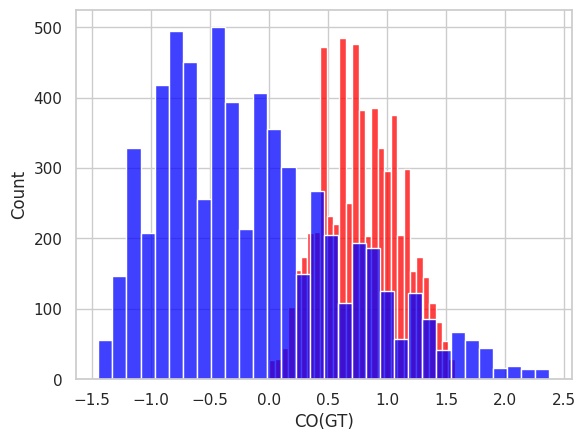

In [931]:
cpy_df = filter_df.copy()
cpy_df = applyLogTransformations(cpy_df, ['CO(GT)','C6H6(GT)','NOx(GT)','NO2(GT)'])
sns.histplot(data=cpy_df, x="CO(GT)",  color="red")
sns.histplot(data=filter_df, x="CO(GT)",  color="blue")


In [932]:

def runLinearReg(X_train, X_test, y_train, y_test):    
    reg=LinearRegression()
    reg.fit(X_train, y_train)
    y_pred=reg.predict(X_test)
    print(r2_score(y_test,y_pred))

In [933]:

def runDecisionTreeReg(X_train, X_test, y_train, y_test):
    reg=DecisionTreeRegressor()
    reg.fit(X_train,y_train)
    y_pred=reg.predict(X_test)
    from sklearn.metrics import r2_score
    print(r2_score(y_test,y_pred))


In [934]:

def runRFReg(X_train, X_test, y_train, y_test):
    reg=RandomForestRegressor()
    reg.fit(X_train,y_train)
    y_pred=reg.predict(X_test)
    from sklearn.metrics import r2_score
    print(r2_score(y_test,y_pred))

In [935]:
def runXGB(X_train, X_test, y_train, y_test):
    xgb_model = XGBRegressor(objective='reg:squarederror')
    xgb_model.fit(X_train, y_train)
    predictions = xgb_model.predict(X_test)
    print(r2_score(y_test,predictions))

In [936]:
to_predict = ['CO(GT)','C6H6(GT)','NOx(GT)','NO2(GT)']
drop_high_colin = ["PT08.S1(CO)","PT08.S5(O3)"]

#X_train, X_test, y_train, y_test
def generateData(data, remove=[]):
     return getDataset(data,
                         [c for c in data.columns if c not in to_predict and c not in drop_high_colin and c not in remove], to_predict)


In [937]:
def applyLogTransformations(frame, cols):
    for col in cols:
        frame[col] = np.log(frame[col] + abs(frame[col].min()) + 1)
        
    return frame
    

In [938]:
modelsEvaluated = pd.DataFrame({
    "model": [],
    "Mean Squared Error" : [],
    "Root Mean Squared Error" : [],
    "Mean Absolute Error" : [],
    "R2 Score": [],
    "Mean Absolute Percentage Error" : []
})

def appendModel(m,mse,rmse,mae,r2,mape):
    global modelsEvaluated
    store = [m,mse,rmse,mae,r2,mape] 
    if (modelsEvaluated['model'] == m).any():
        modelsEvaluated.loc[modelsEvaluated['model'] == m] = store
        return
    
    modelsEvaluated.loc[len(modelsEvaluated.index)] = store

def addNewModelResults(m,y_test,y_pred):
    #TODO :  Make Residual Plots
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mape = np.mean(np.abs((np.array(y_test) - np.array(y_pred)) / np.array(y_test))) * 100.0
    appendModel(m,mse,rmse,mae,r2,mape)
    
    

In [939]:
trans_df = filter_df.copy()

trans_df = applyLogTransformations(trans_df, ['CO(GT)','C6H6(GT)','NOx(GT)','NO2(GT)'])

In [940]:
X_train, X_test, y_train, y_test = generateData(trans_df)

# Simple Linear Regression Model 

In [941]:

reg=LinearRegression()
model = LinearRegression()

reg.fit(X_train, y_train)
y_pred=reg.predict(X_test)
addNewModelResults("simple-linear-regression",y_test,y_pred)
modelsEvaluated

,model,Mean Squared Error,Root Mean Squared Error,Mean Absolute Error,R2 Score,Mean Absolute Percentage Error
0,simple-linear-regression,0.010868,0.104251,0.069145,0.88247,inf


In [942]:
model = LinearRegression()

cv_scores = cross_val_score(model, X_train, y_train, cv=10, scoring='r2')

appendModel("linear-regression-cross-val-10",None, None,None,np.mean(cv_scores),None)
modelsEvaluated

,model,Mean Squared Error,Root Mean Squared Error,Mean Absolute Error,R2 Score,Mean Absolute Percentage Error
0,simple-linear-regression,0.010868,0.104251,0.069145,0.882470,inf
1,linear-regression-cross-val-10,NaN,NaN,NaN,0.877545,NaN


In [943]:
X_train, X_test, y_train, y_test = generateData(cpy_df)
reg = RandomForestRegressor()
reg.fit(X_train, y_train)
y_pred=reg.predict(X_test)
addNewModelResults("simple-random-forest-regression",y_test,y_pred)
modelsEvaluated

,model,Mean Squared Error,Root Mean Squared Error,Mean Absolute Error,R2 Score,Mean Absolute Percentage Error
0,simple-linear-regression,0.010868,0.104251,0.069145,0.882470,inf
1,linear-regression-cross-val-10,NaN,NaN,NaN,0.877545,NaN
2,simple-random-forest-regression,0.007083,0.084159,0.054935,0.923310,inf


In [944]:
reg=XGBRegressor(objective='reg:squarederror')
reg.fit(X_train, y_train)
y_pred=reg.predict(X_test)
addNewModelResults("simple-XGB-regression",y_test,y_pred)
modelsEvaluated

,model,Mean Squared Error,Root Mean Squared Error,Mean Absolute Error,R2 Score,Mean Absolute Percentage Error
0,simple-linear-regression,0.010868,0.104251,0.069145,0.882470,inf
1,linear-regression-cross-val-10,NaN,NaN,NaN,0.877545,NaN
2,simple-random-forest-regression,0.007083,0.084159,0.054935,0.923310,inf
3,simple-XGB-regression,0.005651,0.075176,0.048217,0.938647,inf


In [945]:
num_dependent_variables = len(TO_PREDICT)
n_degrees = 2
r2_scores = []

# Fit and predict for each dependent variable
y_pred_final = pd.DataFrame({})
for i in range(num_dependent_variables):
    model = make_pipeline(PolynomialFeatures(degree=n_degrees), LinearRegression())
    model.fit(X_train, y_train[TO_PREDICT[i]])
    y_pred = model.predict(X_test)
    y_pred_final[TO_PREDICT[i]] = y_pred
    r2 = r2_score(y_test[TO_PREDICT[i]], y_pred)
    r2_scores.append(r2)
    
    poly_models.append(model)
    print(f"R² score for dependent variable {i + 1}: {r2}")


addNewModelResults("polynomical-linear-regression-degree2",y_test,y_pred_final)
modelsEvaluated

R² score for dependent variable 1: 0.8752069778033872
R² score for dependent variable 2: 0.9998877120737494
R² score for dependent variable 3: 0.9236159218771804
R² score for dependent variable 4: 0.8321959310817579


,model,Mean Squared Error,Root Mean Squared Error,Mean Absolute Error,R2 Score,Mean Absolute Percentage Error
0,simple-linear-regression,0.010868,0.104251,0.069145,0.882470,inf
1,linear-regression-cross-val-10,NaN,NaN,NaN,0.877545,NaN
2,simple-random-forest-regression,0.007083,0.084159,0.054935,0.923310,inf
3,simple-XGB-regression,0.005651,0.075176,0.048217,0.938647,inf
4,polynomical-linear-regression-degree2,0.008471,0.092037,0.058064,0.907727,inf


In [946]:
num_dependent_variables = len(TO_PREDICT)
n_degrees = 3
r2_scores = []
y_pred_final = pd.DataFrame({})

# Fit and predict for each dependent variable
for i in range(num_dependent_variables):
    model = make_pipeline(PolynomialFeatures(degree=n_degrees), LinearRegression())
    model.fit(X_train, y_train[TO_PREDICT[i]])
    y_pred = model.predict(X_test)
    y_pred_final[TO_PREDICT[i]] = y_pred
    r2 = r2_score(y_test[TO_PREDICT[i]], y_pred)
    r2_scores.append(r2)
    
    poly_models.append(model)
    print(f"R² score for dependent variable {i + 1}: {r2}")


addNewModelResults("polynomical-linear-regression-degree3",y_test,y_pred_final)
modelsEvaluated

R² score for dependent variable 1: 0.8989697836420782
R² score for dependent variable 2: 0.9999867977766733
R² score for dependent variable 3: 0.9309950524367091
R² score for dependent variable 4: 0.8607838595426606


,model,Mean Squared Error,Root Mean Squared Error,Mean Absolute Error,R2 Score,Mean Absolute Percentage Error
0,simple-linear-regression,0.010868,0.104251,0.069145,0.882470,inf
1,linear-regression-cross-val-10,NaN,NaN,NaN,0.877545,NaN
2,simple-random-forest-regression,0.007083,0.084159,0.054935,0.923310,inf
3,simple-XGB-regression,0.005651,0.075176,0.048217,0.938647,inf
4,polynomical-linear-regression-degree2,0.008471,0.092037,0.058064,0.907727,inf
5,polynomical-linear-regression-degree3,0.007107,0.084301,0.053652,0.922684,inf


In [947]:
num_dependent_variables = len(TO_PREDICT)
n_degrees = 2
r2_scores = []

# Fit and predict for each dependent variable
for i in range(num_dependent_variables):
    model = make_pipeline(PolynomialFeatures(degree=n_degrees), XGBRegressor())
    model.fit(X_train, y_train[TO_PREDICT[i]])
    y_pred = model.predict(X_test)
    
    r2 = r2_score(y_test[TO_PREDICT[i]], y_pred)
    r2_scores.append(r2)
    
    poly_models.append(model)
    print(f"R² score for dependent variable {i + 1}: {r2}")

average_r2_score = np.mean(r2_scores)
appendModel("polynomical-XGB-regression-degree2",None, None, None, average_r2_score,None)
modelsEvaluated

R² score for dependent variable 1: 0.9256227298311792
R² score for dependent variable 2: 0.999940513511371
R² score for dependent variable 3: 0.9398483590844132
R² score for dependent variable 4: 0.8895213410548128


,model,Mean Squared Error,Root Mean Squared Error,Mean Absolute Error,R2 Score,Mean Absolute Percentage Error
0,simple-linear-regression,0.010868,0.104251,0.069145,0.882470,inf
1,linear-regression-cross-val-10,NaN,NaN,NaN,0.877545,NaN
2,simple-random-forest-regression,0.007083,0.084159,0.054935,0.923310,inf
3,simple-XGB-regression,0.005651,0.075176,0.048217,0.938647,inf
4,polynomical-linear-regression-degree2,0.008471,0.092037,0.058064,0.907727,inf
5,polynomical-linear-regression-degree3,0.007107,0.084301,0.053652,0.922684,inf
6,polynomical-XGB-regression-degree2,NaN,NaN,NaN,0.938733,NaN
